In [2]:
import tensorflow as tf
tf.__version__

'2.17.0'

In [3]:
# Do we have access to a GPU?
device_list = tf.config.list_physical_devices()
if "GPU" in [device.device_type for device in device_list]:
  print(f"[INFO] TensorFlow has GPU available to use. Woohoo!! Computing will be sped up!")
  print(f"[INFO] Accessible devices:\n{device_list}")
else:
  print(f"[INFO] TensorFlow does not have GPU available to use. Models may take a while to train.")
  print(f"[INFO] Accessible devices:\n{device_list}")

[INFO] TensorFlow has GPU available to use. Woohoo!! Computing will be sped up!
[INFO] Accessible devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
from pathlib import Path
from google.colab import drive

drive.mount("/content/drive")

# Setup constants
TARGET_DRIVE_PATH = Path("drive/MyDrive/tensorflow/dog_vision_data")
TARGET_FILES = ["images.tar", "annotation.tar", "lists.tar"]
TARGET_URL = "http://vision.stanford.edu/aditya86/ImageNetDogs"

# 3. Setup local path
local_dir = Path("dog_vision_data")

# 4. Check if the target files exist in Google Drive, if so, copy them to Google Colab
if all((TARGET_DRIVE_PATH / file).is_file() for file in TARGET_FILES):
  print(f"[INFO] Copying Dog Vision files from Google Drive to local directory...")
  print(f"[INFO] Source dir: {TARGET_DRIVE_PATH} -> Target dir: {local_dir}")
  !cp -r {TARGET_DRIVE_PATH} .
  print("[INFO] Good to go!")

else:
  # 5. If the files don't exist in Google Drive, download them
  print(f"[INFO] Target files not found in Google Drive.")
  print(f"[INFO] Downloading the target files... this shouldn't take too long...")
  for file in TARGET_FILES:
    # wget is short for "world wide web get", as in "get a file from the web"
    # -nc or --no-clobber = don't download files that already exist locally
    # -P = save the target file to a specified prefix, in our case, local_dir
    !wget -nc {TARGET_URL}/{file} -P {local_dir} # the "!" means to execute the command on the command line rather than in Python

  print(f"[INFO] Saving the target files to Google Drive, so they can be loaded later...")

  # 6. Ensure target directory in Google Drive exists
  TARGET_DRIVE_PATH.mkdir(parents=True, exist_ok=True)

  # 7. Copy downloaded files to Google Drive (so we can use them later and not have to re-download them)
  !cp -r {local_dir}/* {TARGET_DRIVE_PATH}/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[INFO] Copying Dog Vision files from Google Drive to local directory...
[INFO] Source dir: drive/MyDrive/tensorflow/dog_vision_data -> Target dir: dog_vision_data
[INFO] Good to go!


In [5]:
if local_dir.exists():
  print(str(local_dir) + "/")
  for item in local_dir.iterdir():
    print("  ", item.name)

dog_vision_data/
   images.tar
   annotation.tar
   lists.tar


In [6]:
# Untar images, notes/tags:
# -x = extract files from the zipped file
# -v = verbose
# -z = decompress files
# -f = tell tar which file to deal with
!tar -xf dog_vision_data/images.tar
!tar -xf dog_vision_data/annotation.tar
!tar -xf dog_vision_data/lists.tar

In [7]:
import os

os.listdir(".") # "." stands for "here" or "current directory"

['.config',
 'drive',
 'test_list.mat',
 'Images',
 'train_list.mat',
 'file_list.mat',
 'Annotation',
 'dog_vision_data',
 'sample_data']

In [8]:
import scipy

# Open lists of train and test .mat
train_list = scipy.io.loadmat("train_list.mat")
test_list = scipy.io.loadmat("test_list.mat")
file_list = scipy.io.loadmat("file_list.mat")

train_list, type(train_list)

({'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sun Oct  9 08:36:13 2011',
  '__version__': '1.0',
  '__globals__': [],
  'file_list': array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
        dtype=object),
  'annotation_list': array([[array(['n02085620-Chihuahua/n02085620_5927'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_4441'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_1502'], dtype='<U34')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754'], dtype=

In [9]:
train_list.keys()

dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels'])

In [10]:

print(f"Number of files in training list: {len(train_list['file_list'])}")
print(f"Number of files in testing list: {len(test_list['file_list'])}")
print(f"Number of files in full list: {len(file_list['file_list'])}")

Number of files in training list: 12000
Number of files in testing list: 8580
Number of files in full list: 20580


In [11]:
train_list['file_list']

array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
       ...,
       [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
      dtype=object)

In [12]:
# Get a single filename
train_list['file_list'][0][0][0]

'n02085620-Chihuahua/n02085620_5927.jpg'

In [13]:
# Get a Python list of all file names for each list
train_file_list = list([item[0][0] for item in train_list["file_list"]])
test_file_list = list([item[0][0] for item in test_list["file_list"]])
full_file_list = list([item[0][0] for item in file_list["file_list"]])

len(train_file_list), len(test_file_list), len(full_file_list)

(12000, 8580, 20580)

In [14]:
import random

random.sample(train_file_list, k=10)

['n02099601-golden_retriever/n02099601_78.jpg',
 'n02101006-Gordon_setter/n02101006_4470.jpg',
 'n02113799-standard_poodle/n02113799_6740.jpg',
 'n02110627-affenpinscher/n02110627_2383.jpg',
 'n02087394-Rhodesian_ridgeback/n02087394_3256.jpg',
 'n02097130-giant_schnauzer/n02097130_6087.jpg',
 'n02107142-Doberman/n02107142_6816.jpg',
 'n02085620-Chihuahua/n02085620_1617.jpg',
 'n02089078-black-and-tan_coonhound/n02089078_4441.jpg',
 'n02094433-Yorkshire_terrier/n02094433_730.jpg']

In [15]:
os.listdir("Annotation")[:10]

['n02105162-malinois',
 'n02110958-pug',
 'n02116738-African_hunting_dog',
 'n02111129-Leonberg',
 'n02088632-bluetick',
 'n02094433-Yorkshire_terrier',
 'n02102040-English_springer',
 'n02091032-Italian_greyhound',
 'n02096294-Australian_terrier',
 'n02101006-Gordon_setter']

In [16]:
from pathlib import Path

def count_subfolders(directory_path: str) -> int:
    """
    Count the number of subfolders in a given directory.

    Args:
    directory_path (str): The path to the directory in which to count subfolders.

    Returns:
    int: The number of subfolders in the specified directory.

    """
    return len([name for name in Path(directory_path).iterdir() if name.is_dir()])


directory_path = "Annotation"
folder_count = count_subfolders(directory_path)
print(f"Number of subfolders in {directory_path} directory: {folder_count}")

Number of subfolders in Annotation directory: 120


In [17]:
# View a single training file pathname
train_file_list[0]

'n02085620-Chihuahua/n02085620_5927.jpg'

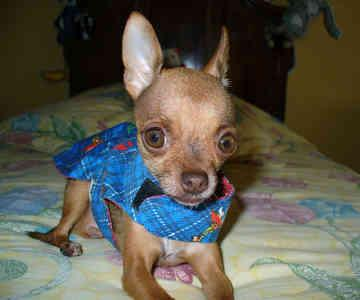

In [18]:
from IPython.display import Image
Image(Path("Images", train_file_list[0]))

In [19]:
# Get a list of all image folders
image_folders = os.listdir("Images")
image_folders[:10]

['n02105162-malinois',
 'n02110958-pug',
 'n02116738-African_hunting_dog',
 'n02111129-Leonberg',
 'n02088632-bluetick',
 'n02094433-Yorkshire_terrier',
 'n02102040-English_springer',
 'n02091032-Italian_greyhound',
 'n02096294-Australian_terrier',
 'n02101006-Gordon_setter']

In [20]:
# Create folder name -> class name dict
folder_to_class_name_dict = {}
for folder_name in image_folders:
  # Turn folder name into class_name
  # E.g. "n02089078-black-and-tan_coonhound" -> "black_and_tan_coonhound"
  # We'll split on the first "-" and join the rest of the string with "_" and then lower it
  class_name = "_".join(folder_name.split("-")[1:]).lower()
  folder_to_class_name_dict[folder_name] = class_name

# Make sure there are 120 entries in the dictionary
assert len(folder_to_class_name_dict) == 120

In [21]:
list(folder_to_class_name_dict.items())[:10]

[('n02105162-malinois', 'malinois'),
 ('n02110958-pug', 'pug'),
 ('n02116738-African_hunting_dog', 'african_hunting_dog'),
 ('n02111129-Leonberg', 'leonberg'),
 ('n02088632-bluetick', 'bluetick'),
 ('n02094433-Yorkshire_terrier', 'yorkshire_terrier'),
 ('n02102040-English_springer', 'english_springer'),
 ('n02091032-Italian_greyhound', 'italian_greyhound'),
 ('n02096294-Australian_terrier', 'australian_terrier'),
 ('n02101006-Gordon_setter', 'gordon_setter')]

In [22]:
dog_names = sorted(list(folder_to_class_name_dict.values()))
dog_names[:10]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle']

In [23]:
path_list = [Path("Images") / Path(file) for file in train_file_list]
path_list[:10]

[PosixPath('Images/n02085620-Chihuahua/n02085620_5927.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_4441.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_1502.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_1916.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_13151.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_1569.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_9654.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_3975.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_3942.jpg'),
 PosixPath('Images/n02085620-Chihuahua/n02085620_9351.jpg')]

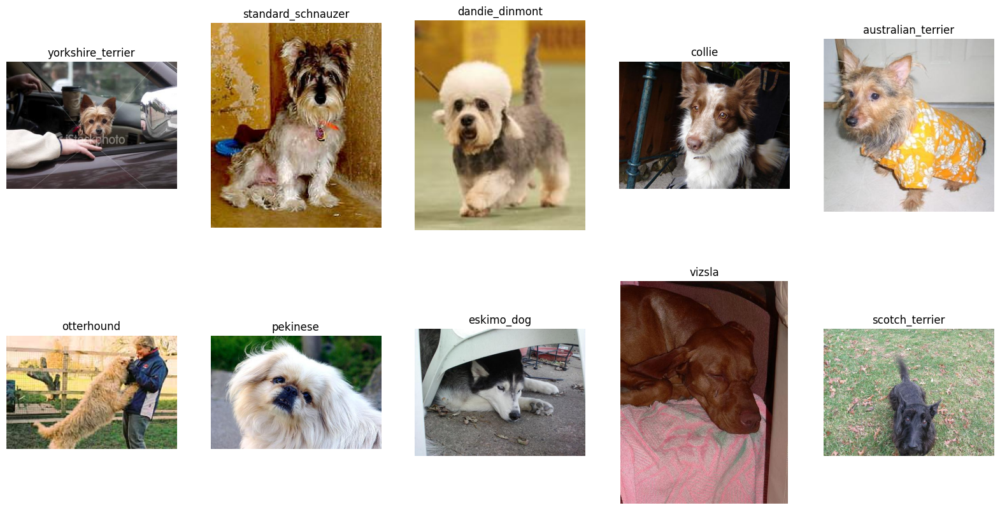

In [24]:
import random

from pathlib import Path
from typing import List

import matplotlib.pyplot as plt

# 1. Take in a select list of image paths
def plot_10_random_images_from_path_list(path_list: List[Path],
                                         extract_title: bool=True) -> None:
  # 2. Set up a grid of plots
  fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))

  # 3. Randomly sample 10 paths from the list
  samples = random.sample(path_list, 10)

  # 4. Iterate through the flattened axes and corresponding sample paths
  for i, ax in enumerate(axes.flat):

    # 5. Get the target sample path (e.g. "Images/n02087394-Rhodesian_ridgeback/n02087394_1161.jpg")
    sample_path = samples[i]

    # 6. Extract the parent directory name to use as the title (if necessary)
    if extract_title:
      sample_title = folder_to_class_name_dict[sample_path.parent.stem]
    else:
      sample_title = sample_path.parent.stem

    # 7. Read the image file and plot it on the corresponding axis
    ax.imshow(plt.imread(sample_path))

    # 8. Set the title of the axis and turn of the axis (for pretty plots)
    ax.set_title(sample_title)
    ax.axis("off")

  # 9. Display the plot
  plt.show()

plot_10_random_images_from_path_list(path_list=[Path("Images") / Path(file) for file in train_file_list])

In [25]:
# Create a dictionary of image counts
from pathlib import Path
from typing import List, Dict

# 1. Take in a target directory
def count_images_in_subdirs(target_directory: str) -> List[Dict[str, int]]:
    """
    Counts the number of JPEG images in each subdirectory of the given directory.

    Each subdirectory is assumed to represent a class, and the function counts
    the number of '.jpg' files within each one. The result is a list of
    dictionaries with the class name and corresponding image count.

    Args:
        target_directory (str): The path to the directory containing subdirectories.

    Returns:
        List[Dict[str, int]]: A list of dictionaries with 'class_name' and 'image_count' for each subdirectory.

    Examples:
        >>> count_images_in_subdirs('/path/to/directory')
        [{'class_name': 'beagle', 'image_count': 50}, {'class_name': 'poodle', 'image_count': 60}]
    """
    # 2. Create a list of all the subdirectoires in the target directory (these contain our images)
    images_dir = Path(target_directory)
    image_class_dirs = [directory for directory in images_dir.iterdir() if directory.is_dir()]

    # 3. Create an empty list to append image counts to
    image_class_counts = []

    # 4. Iterate through all of the subdirectories
    for image_class_dir in image_class_dirs:

        # 5. Get the class name from image directory (e.g. "Images/n02116738-African_hunting_dog" -> "n02116738-African_hunting_dog")
        class_name = image_class_dir.stem

        # 6. Count the number of images in the target subdirectory
        image_count = len(list(image_class_dir.rglob("*.jpg")))  # get length all files with .jpg file extension

        # 7. Append a dictionary of class name and image count to count list
        image_class_counts.append({"class_name": class_name,
                                   "image_count": image_count})

    # 8. Return the list
    return image_class_counts

In [26]:
image_class_counts = count_images_in_subdirs("Images")
image_class_counts[:3]

[{'class_name': 'n02105162-malinois', 'image_count': 150},
 {'class_name': 'n02110958-pug', 'image_count': 200},
 {'class_name': 'n02116738-African_hunting_dog', 'image_count': 169}]

In [27]:
# Create a DataFrame
import pandas as pd
image_counts_df = pd.DataFrame(image_class_counts).sort_values(by="image_count", ascending=False)
image_counts_df.head()

,class_name,image_count
66,n02085936-Maltese_dog,252
76,n02088094-Afghan_hound,239
22,n02092002-Scottish_deerhound,232
39,n02112018-Pomeranian,219
90,n02107683-Bernese_mountain_dog,218


In [28]:
# Make class name column easier to read
image_counts_df["class_name"] = image_counts_df["class_name"].map(folder_to_class_name_dict)
image_counts_df.head()

,class_name,image_count
66,maltese_dog,252
76,afghan_hound,239
22,scottish_deerhound,232
39,pomeranian,219
90,bernese_mountain_dog,218


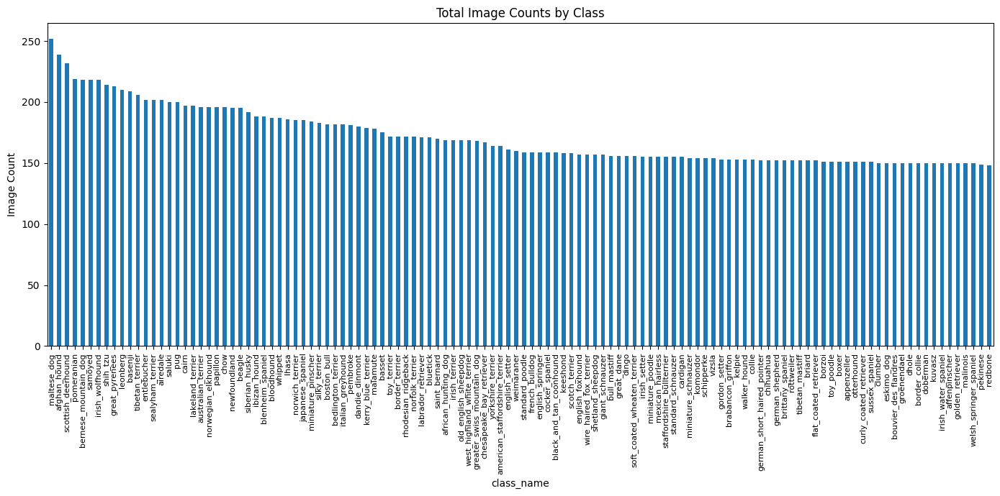

In [29]:
# Turn the image counts DataFrame into a graph
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 7))
image_counts_df.plot(kind="bar",
                     x="class_name",
                     y="image_count",
                     legend=False,
                     ax=plt.gca()) # plt.gca() = "get current axis", get the plt we setup above and put the data there

# Add customization
plt.ylabel("Image Count")
plt.title("Total Image Counts by Class")
plt.xticks(rotation=90, # Rotate the x labels for better visibility
           fontsize=8) # Make the font size smaller for easier reading
plt.tight_layout() # Ensure things fit nicely
plt.show()

In [30]:
image_counts_df.describe()

,image_count
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


In [31]:
from pathlib import Path

# Define the target directory for image splits to go
images_split_dir = Path("images_split")

# Define the training and test directories
train_dir = images_split_dir / "train"
test_dir = images_split_dir / "test"

# Using Path.mkdir with exist_ok=True ensures the directory is created only if it doesn't exist
train_dir.mkdir(parents=True, exist_ok=True)
test_dir.mkdir(parents=True, exist_ok=True)
print(f"Directory {train_dir} exists.")
print(f"Directory {test_dir}  exists.")

# Make a folder for each dog name
for dog_name in dog_names:
  # Make training dir folder
  train_class_dir = train_dir / dog_name
  train_class_dir.mkdir(parents=True, exist_ok=True)
  # print(f"Making directory: {train_class_dir}")

  # Make testing dir folder
  test_class_dir = test_dir / dog_name
  test_class_dir.mkdir(parents=True, exist_ok=True)
  # print(f"Making directory: {test_class_dir}")

# Make sure there is 120 subfolders in each
assert count_subfolders(train_dir) == len(dog_names)
assert count_subfolders(test_dir) == len(dog_names)

Directory images_split/train exists.
Directory images_split/test  exists.


In [32]:
# See the first 10 directories in the training split dir
sorted([str(dir_name) for dir_name in train_dir.iterdir() if dir_name.is_dir()])[:10]

['images_split/train/affenpinscher',
 'images_split/train/afghan_hound',
 'images_split/train/african_hunting_dog',
 'images_split/train/airedale',
 'images_split/train/american_staffordshire_terrier',
 'images_split/train/appenzeller',
 'images_split/train/australian_terrier',
 'images_split/train/basenji',
 'images_split/train/basset',
 'images_split/train/beagle']

In [33]:
from pathlib import Path
from shutil import copy2
from tqdm.auto import tqdm

# 1. Take in a list of source files to copy and a target directory
def copy_files_to_target_dir(file_list: list[str],
                             target_dir: str,
                             images_dir: str = "Images",
                             verbose: bool = False) -> None:
    """
    Copies a list of files from the images directory to a target directory.

    Parameters:
    file_list (list[str]): A list of file paths to copy.
    target_dir (str): The destination directory path where files will be copied.
    images_dir (str, optional): The directory path where the images are currently stored. Defaults to 'Images'.
    verbose (bool, optional): If set to True, the function will print out the file paths as they are being copied. Defaults to False.

    Returns:
    None
    """
    # 2. Iterate through source files
    for file in tqdm(file_list):

      # 3. Convert file path to a Path object
      source_file_path = Path(images_dir) / Path(file)

      # 4. Split the file path and create a Path object for the destination folder
      # e.g. "n02112018-Pomeranian" -> "pomeranian"
      file_class_name = folder_to_class_name_dict[Path(file).parts[0]]

      # 5. Get the name of the target image
      file_image_name = Path(file).name

      # 6. Create the destination path
      destination_file_path = Path(target_dir) / file_class_name / file_image_name

      # 7. Ensure the destination directory exists (this is a safety check, can't copy an image to a file that doesn't exist)
      destination_file_path.parent.mkdir(parents=True, exist_ok=True)

      # 8. Print out copy message if necessary
      if verbose:
        print(f"[INFO] Copying: {source_file_path} to {destination_file_path}")

      # 9. Copy the original path to the destination path
      copy2(src=source_file_path, dst=destination_file_path)

In [34]:
# Copy training images from Images to images_split/train/...
copy_files_to_target_dir(file_list=train_file_list,
                         target_dir=train_dir,
                         verbose=False) # set this to True to get an output of the copy process
                                        # (warning: this will output a large amount of text)

  0%|          | 0/12000 [00:00<?, ?it/s]

In [35]:
copy_files_to_target_dir(file_list=test_file_list,
                         target_dir=test_dir,
                         verbose=False)

  0%|          | 0/8580 [00:00<?, ?it/s]

In [36]:
# Get list of of all .jpg paths in train and test image directories
train_image_paths = list(train_dir.rglob("*.jpg"))
test_image_paths = list(test_dir.rglob("*.jpg"))

assert len(train_image_paths) == len(train_file_list)
assert len(test_image_paths) == len(test_file_list)

print(f"Number of images in {train_dir}: {len(train_image_paths)}")
print(f"Number of images in {test_dir}: {len(test_image_paths)}")

Number of images in images_split/train: 12000
Number of images in images_split/test: 8580


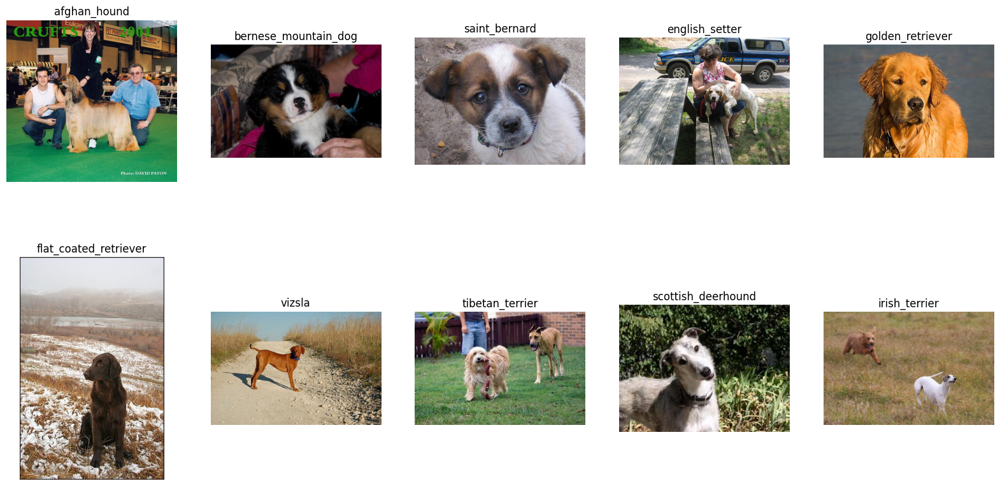

In [37]:
# Plot 10 random images from the train_image_paths
plot_10_random_images_from_path_list(path_list=train_image_paths,
                                     extract_title=False) # don't need to extract the title since the image directories are already named simply

In [38]:
# Create train_10_percent directory
train_10_percent_dir = images_split_dir / "train_10_percent"
train_10_percent_dir.mkdir(parents=True, exist_ok=True)

In [39]:
os.listdir(images_split_dir)

['test', 'train', 'train_10_percent']

In [40]:
import random

# Set a random seed
random.seed(42)

# Get a 10% sample of the training image paths
train_image_paths_random_10_percent = random.sample(population=train_image_paths,
                                                    k=int(0.1*len(train_image_paths)))

# Check how many image paths we got
print(f"Original number of training image paths: {len(train_image_paths)}")
print(f"Number of 10% training image paths: {len(train_image_paths_random_10_percent)}")
print("First 5 random 10% training image paths:")
train_image_paths_random_10_percent[:5]

Original number of training image paths: 12000
Number of 10% training image paths: 1200
First 5 random 10% training image paths:


[PosixPath('images_split/train/brittany_spaniel/n02101388_1456.jpg'),
 PosixPath('images_split/train/weimaraner/n02092339_6430.jpg'),
 PosixPath('images_split/train/soft_coated_wheaten_terrier/n02098105_911.jpg'),
 PosixPath('images_split/train/dhole/n02115913_1067.jpg'),
 PosixPath('images_split/train/lhasa/n02098413_5806.jpg')]

In [41]:
# Copy training 10% split images from images_split/train/ to images_split/train_10_percent/...
for source_file_path in tqdm(train_image_paths_random_10_percent):

  # Create the destination file path
  destination_file_and_image_name = Path(*source_file_path.parts[-2:]) # "images_split/train/yorkshire_terrier/n02094433_2223.jpg" -> "yorkshire_terrier/n02094433_2223.jpg"
  destination_file_path = train_10_percent_dir / destination_file_and_image_name # "yorkshire_terrier/n02094433_2223.jpg" -> "images_split/train_10_percent/yorkshire_terrier/n02094433_2223.jpg"

  # If the target directory doesn't exist, make it
  target_class_dir = destination_file_path.parent
  if not target_class_dir.is_dir():
    # print(f"Making directory: {target_class_dir}")
    target_class_dir.mkdir(parents=True,
                           exist_ok=True)

  # print(f"Copying: {source_file_path} to {destination_file_path}")
  copy2(src=source_file_path,
        dst=destination_file_path)

  0%|          | 0/1200 [00:00<?, ?it/s]

In [42]:
# Count images in train_10_percent_dir
train_10_percent_image_class_counts = count_images_in_subdirs(train_10_percent_dir)
train_10_percent_image_class_counts_df = pd.DataFrame(train_10_percent_image_class_counts).sort_values("image_count", ascending=True)
train_10_percent_image_class_counts_df.head()

,class_name,image_count
33,bedlington_terrier,3
64,tibetan_mastiff,4
23,german_short_haired_pointer,4
61,wire_haired_fox_terrier,4
58,airedale,5


In [43]:
# How many subfolders are there?
print(len(train_10_percent_image_class_counts_df))

120


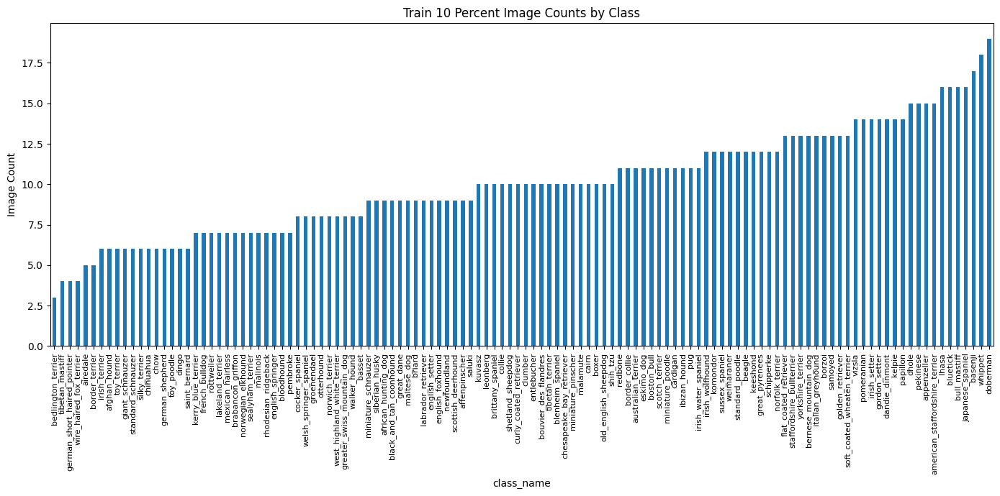

In [44]:
# Plot distribution of train 10% dataset.
plt.figure(figsize=(14, 7))
train_10_percent_image_class_counts_df.plot(kind="bar",
                     x="class_name",
                     y="image_count",
                     legend=False,
                     ax=plt.gca()) # plt.gca() = "get current axis", get the plt we setup above and put the data there

# Add customization
plt.title("Train 10 Percent Image Counts by Class")
plt.ylabel("Image Count")
plt.xticks(rotation=90, # Rotate the x labels for better visibility
           fontsize=8) # Make the font size smaller for easier reading
plt.tight_layout() # Ensure things fit nicely
plt.show()

In [45]:
import tensorflow as tf

# Create constants
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

# Create train 10% dataset
train_10_percent_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_10_percent_dir,
    label_mode="categorical", # turns labels into one-hot representations (e.g. [0, 0, 1, ..., 0, 0])
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=True, # shuffle training datasets to prevent learning of order
    seed=SEED
)

# Create full train dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_dir,
    label_mode="categorical",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=True,
    seed=SEED
)

# Create test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
    directory=test_dir,
    label_mode="categorical",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=False, # don't need to shuffle the test dataset (this makes evaluations easier)
    seed=SEED
)

Found 1200 files belonging to 120 classes.
Found 12000 files belonging to 120 classes.
Found 8580 files belonging to 120 classes.


In [46]:
train_10_percent_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [47]:
# What does a single batch look like?
image_batch, label_batch = next(iter(train_ds))
image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32, 120]))

In [48]:
# Get a single sample from a single batch
print(f"Single image tensor:\n{image_batch[0]}\n")
print(f"Single label tensor: {label_batch[0]}") # notice the 1 is the index of the target label (our labels are one-hot encoded)
print(f"Single sample class name: {dog_names[tf.argmax(label_batch[0])]}")

Single image tensor:
[[[196.61607  174.61607  160.61607 ]
  [197.84822  175.84822  161.84822 ]
  [200.       178.       164.      ]
  ...
  [ 60.095097  79.75804   45.769207]
  [ 61.83293   71.22575   63.288315]
  [ 77.65755   83.65755   81.65755 ]]

 [[196.       174.       160.      ]
  [197.83876  175.83876  161.83876 ]
  [199.07945  177.07945  163.07945 ]
  ...
  [ 94.573715 110.55229   83.59694 ]
  [125.869865 135.26268  127.33472 ]
  [122.579605 128.5796   126.579605]]

 [[195.73691  173.73691  159.73691 ]
  [196.896    174.896    160.896   ]
  [199.       177.       163.      ]
  ...
  [ 26.679413  38.759026  20.500835]
  [ 24.372307  31.440136  26.675896]
  [ 20.214453  26.214453  24.214453]]

 ...

 [[ 61.57369   70.18976  104.72547 ]
  [189.91965  199.61607  213.28572 ]
  [247.26637  255.       252.70387 ]
  ...
  [113.40158   83.40158   57.40158 ]
  [110.75214   78.75214   53.752136]
  [107.37048   75.37048   50.370483]]

 [[ 61.27007   69.88614  104.42185 ]
  [188.93079  19

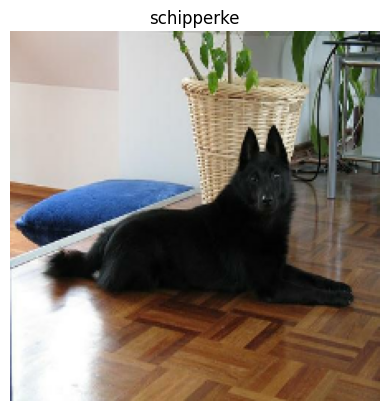

In [49]:
plt.imshow(image_batch[0].numpy().astype("uint8")) # convert tensor to uint8 to avoid matplotlib colour range issues
plt.title(dog_names[tf.argmax(label_batch[0])])
plt.axis("off");

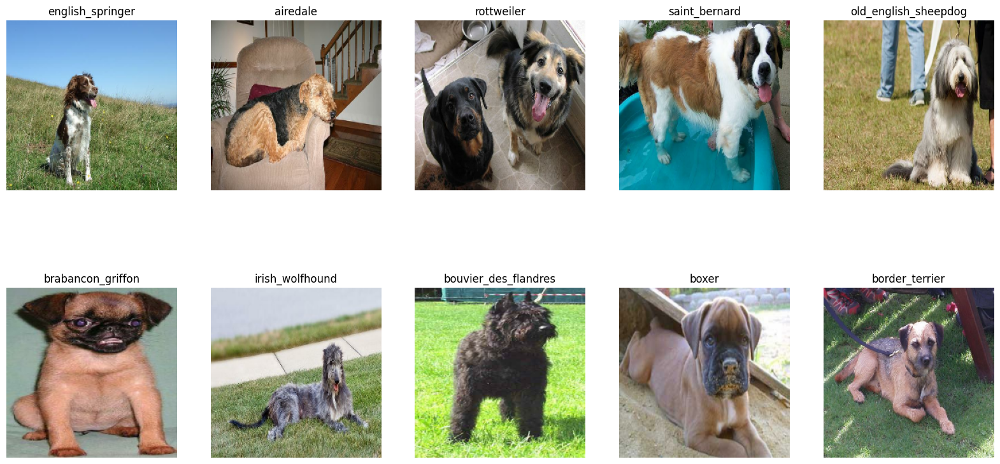

In [50]:
# Create multiple subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))

# Iterate through a single batch and plot images
for images, labels in train_ds.take(count=1): # note: because our training data is shuffled, each "take" will be different
  for i, ax in enumerate(axes.flat):
    ax.imshow(images[i].numpy().astype("uint8"))
    ax.set_title(dog_names[tf.argmax(labels[i])])
    ax.axis("off")

In [51]:
# Get the first 5 file paths of the training dataset
train_ds.file_paths[:5]

['images_split/train/boston_bull/n02096585_1753.jpg',
 'images_split/train/kerry_blue_terrier/n02093859_855.jpg',
 'images_split/train/border_terrier/n02093754_2281.jpg',
 'images_split/train/rottweiler/n02106550_11823.jpg',
 'images_split/train/airedale/n02096051_5884.jpg']

In [52]:
# Get the class names TensorFlow has read from the target directory
class_names = train_ds.class_names
class_names[:5]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier']

In [53]:
assert set(train_10_percent_ds.class_names) == set(train_ds.class_names) == set(test_ds.class_names)

In [54]:
AUTOTUNE = tf.data.AUTOTUNE # let TensorFlow find the best values to use automatically

# Shuffle and optimize performance on training datasets
# Note: these methods can be chained together and will have the same effect as calling them individually
train_10_percent_ds = train_10_percent_ds.cache().shuffle(buffer_size=10*BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
train_ds = train_ds.cache().shuffle(buffer_size=100*BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

# Don't need to shuffle test datasets (for easier evaluation)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [55]:
# Create the input shape to our model
INPUT_SHAPE = (*IMG_SIZE, 3)

base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=True, # do want to include the top layer? (ImageNet has 1000 classes, so the top layer is formulated for this, we want to create our own top layer)
    include_preprocessing=True, # do we want the network to preprocess our data into the right format for us? (yes)
    weights="imagenet", # do we want the network to come with pretrained weights? (yes)
    input_shape=INPUT_SHAPE # what is the input shape of our data we're going to pass to the network? (224, 224, 3) -> (height, width, colour_channels)
)

29403144/29403144 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [56]:
base_model.summary()

Model: "efficientnetv2-b0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              0 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, 112, 112, 16)   │          4,608 │ stem_activation[0][0]  │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn        │ (None, 112, 112, 16)   │             64 │ block1a_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_activati… │ (None, 112, 112, 16)   │              0 │ block1a_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_conv       │ (None, 56, 56, 64)     │          9,216 │ block1a_project_activ… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_bn         │ (None, 56, 56, 64)     │            256 │ block2a_expand_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_activation │ (None, 56, 56, 64)     │              0 │ block2a_expand_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_project_conv      │ (None, 56, 56, 32)     │          2,048 │ block2a_expand_activa… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_project_bn        │ (None, 56, 56, 32)     │            128 │ block2a_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 7,200,312 (27.47 MB)

 Trainable params: 7,139,704 (27.24 MB)

 Non-trainable params: 60,608 (236.75 KB)

In [57]:
# Count the number of layers
print(f"Number of layers in base_model: {len(base_model.layers)}")

Number of layers in base_model: 273


In [58]:
# Check the input shape of our model
base_model.input_shape

(None, 224, 224, 3)

In [59]:
# Check the model's output shape
base_model.output_shape

(None, 1000)

In [60]:
# # Create a base model with 120 output classes
# base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
#     include_top=True,
#     include_preprocessing=True,
#     weights="imagenet",
#     input_shape=INPUT_SHAPE,
#     classes=len(dog_names)
# )

# base_model.output_shape

In [61]:
# Create a base model with no top
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False, # don't include the top layer (we want to make our own top layer)
    include_preprocessing=True,
    weights="imagenet",
    input_shape=INPUT_SHAPE,
)

# Check the output shape
base_model.output_shape

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


(None, 7, 7, 1280)

In [62]:
# Count the number of layers
print(f"Number of layers in base_model: {len(base_model.layers)}")

Number of layers in base_model: 270


In [63]:
# Check the number of parameters in our model
base_model.count_params()

5919312

In [64]:
import numpy as np

def count_parameters(model, print_output=True):
  """
  Counts the number of trainable, non-trainable and total parameters of a given model.
  """
  trainable_parameters = np.sum([np.prod(layer.shape) for layer in model.trainable_weights])
  non_trainable_parameters = np.sum([np.prod(layer.shape) for layer in model.non_trainable_weights])
  total_parameters = trainable_parameters + non_trainable_parameters
  if print_output:
    print(f"Model {model.name} parameter counts:")
    print(f"Total parameters: {total_parameters}")
    print(f"Trainable parameters: {trainable_parameters}")
    print(f"Non-trainable parameters: {non_trainable_parameters}")
  else:
    return total_parameters, trainable_parameters, non_trainable_parameters

count_parameters(model=base_model, print_output=True)

Model efficientnetv2-b0 parameter counts:
Total parameters: 5919312
Trainable parameters: 5858704
Non-trainable parameters: 60608


In [65]:
# Freeze the base model
base_model.trainable = False
base_model.trainable

False

In [66]:
count_parameters(model=base_model, print_output=True)

Model efficientnetv2-b0 parameter counts:
Total parameters: 5919312.0
Trainable parameters: 0.0
Non-trainable parameters: 5919312


In [67]:
# # Extract features from a single image using our base model
# feature_extraction = base_model(image_batch[0])
# feature_extraction

In [68]:
# Current image shape
shape_of_image_without_batch = image_batch[0].shape

# Add a batch dimension to our single image
shape_of_image_with_batch = tf.expand_dims(input=image_batch[0], axis=0).shape

print(f"Shape of image without batch: {shape_of_image_without_batch}")
print(f"Shape of image with batch: {shape_of_image_with_batch}")

Shape of image without batch: (224, 224, 3)
Shape of image with batch: (1, 224, 224, 3)


In [69]:
# Extract features from a single image using our base model
feature_extraction = base_model(tf.expand_dims(image_batch[0], axis=0))
feature_extraction

<tf.Tensor: shape=(1, 7, 7, 1280), dtype=float32, numpy=
array([[[[-2.19666228e-01, -3.44590954e-02, -1.40371546e-01, ...,
          -1.43816575e-01, -2.73893476e-01, -7.41284490e-02],
         [-8.71265680e-02, -6.49359971e-02, -2.14303717e-01, ...,
          -4.49314825e-02, -2.77881980e-01, -8.20843726e-02],
         [-2.76884228e-01, -8.26962218e-02, -3.71918231e-02, ...,
          -2.72177041e-01, -2.52441019e-01, -2.27921486e-01],
         ...,
         [-1.01624630e-01, -3.55107225e-02, -2.23242551e-01, ...,
          -2.25994766e-01, -8.58971030e-02, -1.60470575e-01],
         [-5.88958114e-02, -4.66221618e-03, -1.05260395e-01, ...,
          -2.86725461e-02, -9.04733390e-02, -1.82703212e-01],
         [-6.27497286e-02, -1.38896063e-03,  1.64912436e-02, ...,
          -7.83769600e-03, -1.84441745e-01, -2.62531608e-01]],

        [[-2.17437357e-01, -1.10297985e-01, -2.74635911e-01, ...,
          -2.22221687e-01, -2.74878472e-01, -1.02069423e-01],
         [-1.40874594e-01, -1.6

In [70]:
# Check shape of feature extraction
feature_extraction.shape

TensorShape([1, 7, 7, 1280])

In [71]:
num_input_features = 224*224*3
feature_extraction_features = 1*7*7*1280

# Calculate the compression ratio
num_input_features / feature_extraction_features

2.4

In [72]:
# Turn feature extraction into a feature vector
feature_vector = tf.keras.layers.GlobalAveragePooling2D()(feature_extraction) # pass feature_extraction to the pooling layer
feature_vector

<tf.Tensor: shape=(1, 1280), dtype=float32, numpy=
array([[-0.11547604, -0.04464175, -0.12463235, ..., -0.09110407,
        -0.08422071, -0.07771036]], dtype=float32)>

In [73]:
# Check out the feature vector shape
feature_vector.shape

TensorShape([1, 1280])

In [74]:
# Compare the reduction
num_input_features = 224*224*3
feature_extraction_features = 1*7*7*1280
feature_vector_features = 1*1280

print(f"Input -> feature extraction reduction factor: {num_input_features / feature_extraction_features}")
print(f"Feature extraction -> feature vector reduction factor: {feature_extraction_features / feature_vector_features}")
print(f"Input -> feature extraction -> feature vector reduction factor: {num_input_features / feature_vector_features}")

Input -> feature extraction reduction factor: 2.4
Feature extraction -> feature vector reduction factor: 49.0
Input -> feature extraction -> feature vector reduction factor: 117.6


In [75]:
# Create a base model with no top and a pooling layer built-in
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=INPUT_SHAPE,
    pooling="avg", # can also use "max"
    include_preprocessing=True,
)

# Check the output shape
base_model.output_shape

(None, 1280)

In [76]:
# Freeze the base weights
base_model.trainable = False

# Count the parameters
count_parameters(model=base_model, print_output=True)

Model efficientnetv2-b0 parameter counts:
Total parameters: 5919312.0
Trainable parameters: 0.0
Non-trainable parameters: 5919312


In [77]:
# Get a feature vector of a single image (don't forget to add a batch dimension)
feature_vector_2 = base_model(tf.expand_dims(image_batch[0], axis=0))
feature_vector_2

<tf.Tensor: shape=(1, 1280), dtype=float32, numpy=
array([[-0.11547604, -0.04464175, -0.12463235, ..., -0.09110407,
        -0.08422071, -0.07771036]], dtype=float32)>

In [78]:
# Compare the two feature vectors
np.all(feature_vector == feature_vector_2)

True

In [79]:
# Create a sequential model with explicit input shape
tf.random.set_seed(42)
sequential_model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=INPUT_SHAPE),  # Add explicit input layer
    base_model,  # pre-trained base model
    tf.keras.layers.Dense(units=len(dog_names), activation="softmax")  # output layer
])

# Now you can call summary() directly
sequential_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetv2-b0 (Functional)       │ (None, 1280)                │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [80]:
# Check the input shape
sequential_model.input_shape

(None, 224, 224, 3)

In [81]:
# Check the output shape
sequential_model.output_shape

(None, 120)

In [82]:
# Get a single image with a batch size of 1
single_image_input = tf.expand_dims(image_batch[0], axis=0)

# Pass the image through our model
single_image_output_sequential = sequential_model(single_image_input)

# Check the output
single_image_output_sequential

<tf.Tensor: shape=(1, 120), dtype=float32, numpy=
array([[0.00739422, 0.01007199, 0.00750839, 0.01037522, 0.00914683,
        0.01008245, 0.01617211, 0.01186169, 0.0050323 , 0.00921367,
        0.0101246 , 0.00688259, 0.00805087, 0.01020521, 0.00665815,
        0.00923046, 0.01080929, 0.01192026, 0.00912759, 0.00630154,
        0.00840005, 0.00706751, 0.00451331, 0.00677732, 0.0090298 ,
        0.01140926, 0.00605756, 0.00953389, 0.00482888, 0.01250362,
        0.00576935, 0.00445512, 0.01085146, 0.00990066, 0.00493087,
        0.01055654, 0.00653558, 0.01026624, 0.00817772, 0.00829193,
        0.00495387, 0.00799495, 0.00694117, 0.00910734, 0.00628629,
        0.01004171, 0.00497179, 0.00914372, 0.00768328, 0.01055163,
        0.0098565 , 0.01222307, 0.01172944, 0.00620059, 0.00845309,
        0.00493411, 0.01154589, 0.01248951, 0.00354387, 0.00730369,
        0.00721942, 0.0092721 , 0.00461728, 0.00538982, 0.01060608,
        0.01033975, 0.00852494, 0.01132779, 0.00986661, 0.00489724

In [83]:
# Find the index with the highest value
highest_value_index_sequential_model_output = np.argmax(single_image_output_sequential)
highest_value_sequential_model_output = np.max(single_image_output_sequential)

print(f"Highest value index: {highest_value_index_sequential_model_output} ({dog_names[highest_value_index_sequential_model_output]})")
print(f"Prediction probability: {highest_value_sequential_model_output}")

Highest value index: 6 (australian_terrier)
Prediction probability: 0.016172105446457863


In [84]:
# Check the original label value
print(f"Predicted value: {highest_value_index_sequential_model_output}")
print(f"Actual value: {tf.argmax(label_batch[0]).numpy()}")

Predicted value: 6
Actual value: 95


In [85]:
# Index on class_names with our model's highest prediction probability
sequential_model_predicted_label = class_names[tf.argmax(sequential_model(tf.expand_dims(image_batch[0], axis=0)), axis=1).numpy()[0]]

# Get the truth label
single_image_ground_truth_label = class_names[tf.argmax(label_batch[0])]

# Print predicted and ground truth labels
print(f"Sequential model predicted label: {sequential_model_predicted_label}")
print(f"Ground truth label: {single_image_ground_truth_label}")

Sequential model predicted label: australian_terrier
Ground truth label: schipperke


In [86]:
# 1. Create input layer
inputs = tf.keras.Input(shape=INPUT_SHAPE)

# 2. Create hidden layer
x = base_model(inputs, training=False)

# 3. Create the output layer
outputs = tf.keras.layers.Dense(units=len(class_names), # one output per class
                                activation="softmax",
                                name="output_layer")(x)

# 4. Connect the inputs and outputs together
functional_model = tf.keras.Model(inputs=inputs,
                                  outputs=outputs,
                                  name="functional_model")

# Get a model summary
functional_model.summary()

Model: "functional_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 1280)                │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [87]:
# Pass a single image through our functional_model
single_image_output_functional = functional_model(single_image_input)

# Find the index with the highest value
highest_value_index_functional_model_output = np.argmax(single_image_output_functional)
highest_value_functional_model_output = np.max(single_image_output_functional)

highest_value_index_functional_model_output, highest_value_functional_model_output

(51, 0.017983662)

In [88]:
def create_model(include_top: bool = False,
                 num_classes: int = 1000,
                 input_shape: tuple[int, int, int] = (224, 224, 3),
                 include_preprocessing: bool = True,
                 trainable: bool = False,
                 dropout: float = 0.2,
                 model_name: str = "model") -> tf.keras.Model:
  """
  Create an EfficientNetV2 B0 feature extractor model with a custom classifier layer.

  Args:
      include_top (bool, optional): Whether to include the top (classifier) layers of the model.
      num_classes (int, optional): Number of output classes for the classifier layer.
      input_shape (tuple[int, int, int], optional): Input shape for the model's images (height, width, channels).
      include_preprocessing (bool, optional): Whether to include preprocessing layers for image normalization.
      trainable (bool, optional): Whether to make the base model trainable.
      dropout (float, optional): Dropout rate for the global average pooling layer.
      model_name (str, optional): Name for the created model.

  Returns:
      tf.keras.Model: A TensorFlow Keras model with the specified configuration.
  """
  # Create base model
  base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=include_top,
    weights="imagenet",
    input_shape=input_shape,
    include_preprocessing=include_preprocessing,
    pooling="avg" # Can use this instead of adding tf.keras.layers.GlobalPooling2D() to the model
    # pooling="max" # Can use this instead of adding tf.keras.layers.MaxPooling2D() to the model
  )

  # Freeze the base model (if necessary)
  base_model.trainable = trainable

  # Create input layer
  inputs = tf.keras.Input(shape=input_shape, name="input_layer")

  # Create model backbone (middle/hidden layers)
  x = base_model(inputs, training=trainable)
  # x = tf.keras.layers.GlobalAveragePooling2D()(x) # note: you should include pooling here if not using `pooling="avg"`
  # x = tf.keras.layers.Dropout(0.2)(x) # optional regularization layer (search "dropout" for more)

  # Create output layer (also known as "classifier" layer)
  outputs = tf.keras.layers.Dense(units=num_classes,
                                  activation="softmax",
                                  name="output_layer")(x)

  # Connect input and output layer
  model = tf.keras.Model(inputs=inputs,
                         outputs=outputs,
                         name=model_name)

  return model

In [89]:
# Create a model
model_0 = create_model(num_classes=len(class_names))
model_0.summary()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 1280)                │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [90]:
for layer in model_0.layers:
  print(layer.name, layer.trainable)

input_layer True
efficientnetv2-b0 False
output_layer True


In [91]:
# 1. Create model
model_0 = create_model(num_classes=len(class_names),
                       model_name="model_0")

model_0.summary()

Model: "model_0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 1280)                │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [92]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
optimizer

In [93]:
# Create loss function
loss = tf.keras.losses.CategoricalCrossentropy(from_logits=False)
loss

In [94]:
# Create list of evaluation metrics
metrics = ["accuracy"]

In [95]:
# Compile model with shortcuts (faster to write code but less customizable)
model_0.compile(optimizer="adam",
                loss="categorical_crossentropy",
                metrics=["accuracy"])

# Compile model with classes (will do the same as above)
model_0.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                metrics=["accuracy"])

In [97]:
# 1. Create a model
model_0 = create_model(num_classes=len(dog_names))

# 2. Compile the model
model_0.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

# 3. Fit the model
epochs = 5
history_0 = model_0.fit(x=train_10_percent_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 43s 591ms/step - accuracy: 0.1303 - loss: 4.4122 - val_accuracy: 0.5310 - val_loss: 3.0646
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.7204 - loss: 2.3752 - val_accuracy: 0.6774 - val_loss: 1.9182
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.8720 - loss: 1.2631 - val_accuracy: 0.7524 - val_loss: 1.3484
Epoch 4/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.9397 - loss: 0.7764 - val_accuracy: 0.7952 - val_loss: 1.0546
Epoch 5/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.9580 - loss: 0.5524 - val_accuracy: 0.8107 - val_loss: 0.8977


In [98]:
# Inspect History.history attribute for model_0
history_0.history

{'accuracy': [0.2608333230018616,
  0.7283333539962769,
  0.8616666793823242,
  0.9316666722297668,
  0.9583333134651184],
 'loss': [3.9868476390838623,
  2.1530356407165527,
  1.188725471496582,
  0.744991660118103,
  0.5139589905738831],
 'val_accuracy': [0.5310023427009583,
  0.6773892641067505,
  0.7524475455284119,
  0.7952214479446411,
  0.8107225894927979],
 'val_loss': [3.0645904541015625,
  1.9181995391845703,
  1.3483773469924927,
  1.0545662641525269,
  0.8977370858192444]}

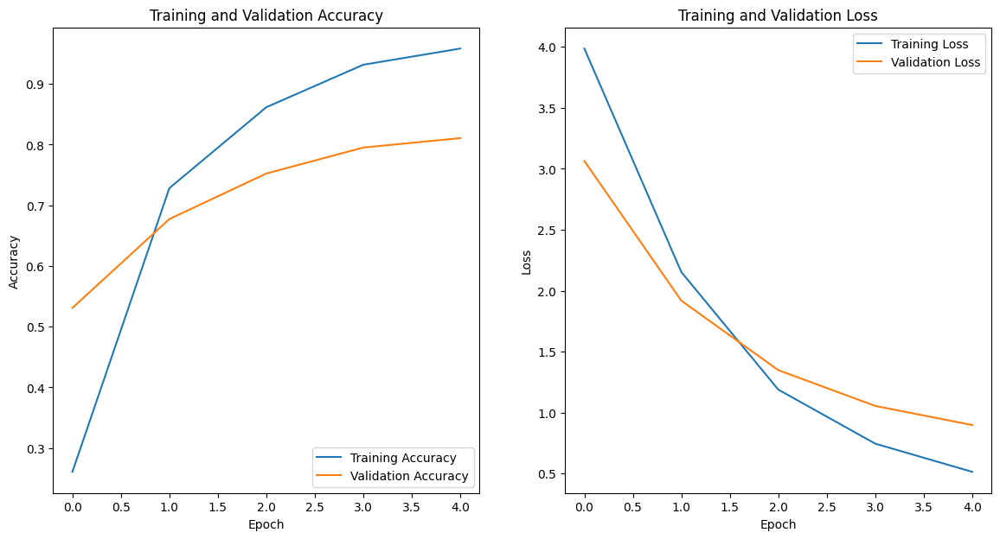

In [99]:
def plot_model_loss_curves(history: tf.keras.callbacks.History) -> None:
  """Takes a History object and plots loss and accuracy curves."""

  # Get the accuracy values
  acc = history.history["accuracy"]
  val_acc = history.history["val_accuracy"]

  # Get the loss values
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  # Get the number of epochs
  epochs_range = range(len(acc))

  # Create accuracy curves plot
  plt.figure(figsize=(14, 7))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label="Training Accuracy")
  plt.plot(epochs_range, val_acc, label="Validation Accuracy")
  plt.legend(loc="lower right")
  plt.title("Training and Validation Accuracy")
  plt.xlabel("Epoch")
  plt.ylabel("Accuracy")

  # Create loss curves plot
  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label="Training Loss")
  plt.plot(epochs_range, val_loss, label="Validation Loss")
  plt.legend(loc="upper right")
  plt.title("Training and Validation Loss")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")

  plt.show()

plot_model_loss_curves(history=history_0)

In [100]:
model_0_results = model_0.evaluate(x=test_ds)
model_0_results

269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.8459 - loss: 0.8470


[0.8977370858192444, 0.8107225894927979]

In [101]:
# 1. Create model_1 (the next iteration of model_0)
model_1 = create_model(num_classes=len(class_names),
                       model_name="model_1")

# 2. Compile model
model_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

# 3. Fit model
epochs=5
history_1 = model_1.fit(x=train_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 44s 43ms/step - accuracy: 0.5671 - loss: 2.3927 - val_accuracy: 0.8684 - val_loss: 0.5014
Epoch 2/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.8885 - loss: 0.4545 - val_accuracy: 0.8796 - val_loss: 0.4051
Epoch 3/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.9147 - loss: 0.3264 - val_accuracy: 0.8763 - val_loss: 0.3865
Epoch 4/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.9254 - loss: 0.2697 - val_accuracy: 0.8818 - val_loss: 0.3689
Epoch 5/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.9347 - loss: 0.2245 - val_accuracy: 0.8818 - val_loss: 0.3649


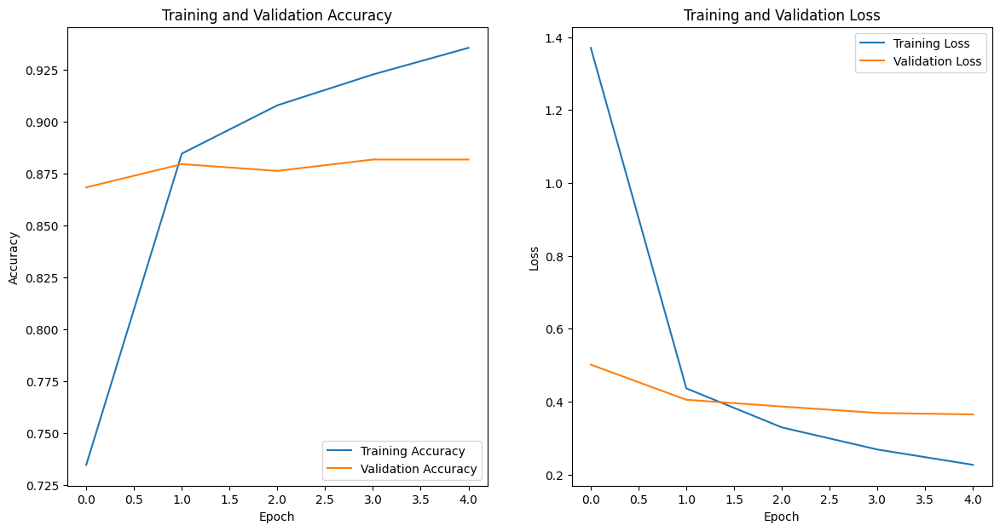

In [102]:
# Plot model_1 loss curves
plot_model_loss_curves(history=history_1)

In [103]:
# Evaluate model_1
model_1_results = model_1.evaluate(test_ds)

269/269 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.9002 - loss: 0.3204


In [104]:
test_preds = model_1.predict(test_ds)



269/269 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step


In [105]:
test_preds.shape

(8580, 120)

In [106]:
# Get a "random" variable between all of the test samples
random.seed(42)
random_test_index = random.randint(0, test_preds.shape[0] - 1)
print(f"[INFO] Random test index: {random_test_index}")

# Inspect a single test prediction sample
random_test_pred_sample = test_preds[random_test_index]

print(f"[INFO] Random test pred sample shape: {random_test_pred_sample.shape}")
print(f"[INFO] Random test pred sample argmax: {tf.argmax(random_test_pred_sample)}")
print(f"[INFO] Random test pred sample label: {dog_names[tf.argmax(random_test_pred_sample)]}")
print(f"[INFO] Random test pred sample max prediction probability: {tf.reduce_max(random_test_pred_sample)}")
print(f"[INFO] Random test pred sample prediction probability values:\n{random_test_pred_sample}")

[INFO] Random test index: 1824
[INFO] Random test pred sample shape: (120,)
[INFO] Random test pred sample argmax: 24
[INFO] Random test pred sample label: brittany_spaniel
[INFO] Random test pred sample max prediction probability: 0.9613493084907532
[INFO] Random test pred sample prediction probability values:
[7.5721641e-07 1.6679700e-05 1.1563474e-06 1.1250007e-05 5.2556049e-07
 2.5674267e-06 4.4275379e-07 2.4053070e-06 9.8903286e-07 2.5406704e-04
 1.4127900e-06 1.1348600e-06 1.7849128e-07 3.1733589e-04 7.5591697e-07
 5.7684965e-06 2.8589809e-06 6.2065044e-07 4.6993868e-05 6.2188015e-08
 1.1891296e-07 1.1269083e-06 1.0508660e-06 1.5169213e-06 9.6134931e-01
 1.8538815e-06 3.2409582e-07 4.3034106e-07 1.1764478e-05 6.0817515e-06
 3.9252640e-07 1.0728563e-04 4.6095607e-05 1.2884230e-05 3.2761066e-06
 1.2806599e-07 1.0715423e-06 1.6967324e-06 3.2195726e-07 1.1825446e-03
 2.8888790e-02 4.4917022e-05 1.7645177e-06 9.6086148e-07 1.1189275e-05
 7.1663749e-08 8.7198146e-07 7.1678218e-04 9.077

In [107]:
import numpy as np

# Extract test images and labels from test_ds
test_ds_images = np.concatenate([images for images, labels in test_ds], axis=0)
test_ds_labels = np.concatenate([labels for images, labels in test_ds], axis=0)

# How many images and labels do we have?
len(test_ds_images), len(test_ds_labels)

(8580, 8580)

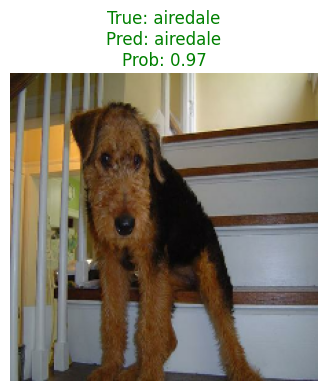

In [110]:
# Set target index
target_index = 258 # try changing this to another value and seeing how the model performs on other samples

# Get test image
test_image = test_ds_images[target_index]

# Get truth label (index of max in test label)
test_image_truth_label = class_names[tf.argmax(test_ds_labels[target_index])]

# Get prediction probabilities
test_image_pred_probs = test_preds[target_index]

# Get index of class with highest prediction probability
test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

# Plot the image
plt.figure(figsize=(5, 4))
plt.imshow(test_image.astype("uint8"))

# Create sample title with prediction probability value
title = f"""True: {test_image_truth_label}
Pred: {test_image_pred_class}
Prob: {np.max(test_image_pred_probs):.2f}"""

# Colour the title based on correctness of pred
plt.title(title,
          color="green" if test_image_truth_label == test_image_pred_class else "red")
plt.axis("off");


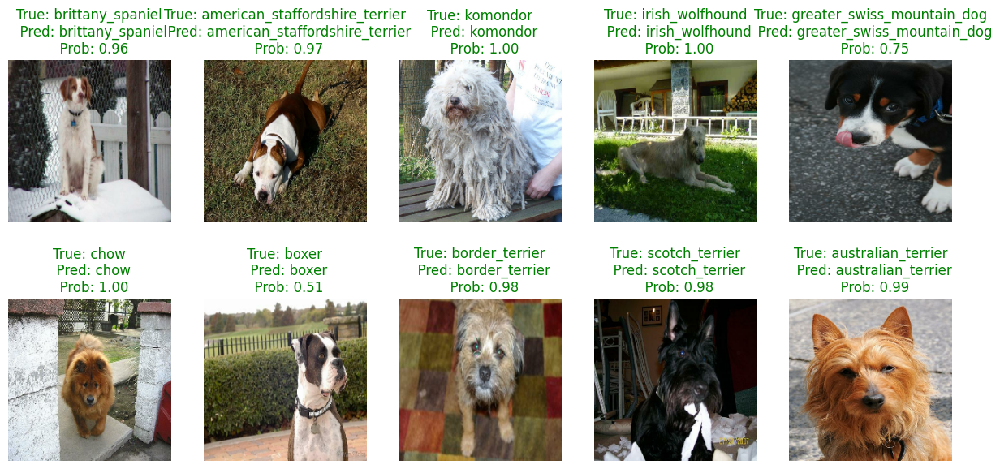

In [111]:
# Choose a random 10 indexes from the test data and compare the values
import random

random.seed(42) # try changing the random seed or commenting it out for different values
random_indexes = random.sample(range(len(test_ds_images)), 10)

# Create a plot with multiple subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

# Loop through the axes of the plot
for i, ax in enumerate(axes.flatten()):
  target_index = random_indexes[i] # get a random index (this is another reason we didn't shuffle the test set)

  # Get relevant target image, label, prediction and prediction probabilities
  test_image = test_ds_images[target_index]
  test_image_truth_label = class_names[tf.argmax(test_ds_labels[target_index])]
  test_image_pred_probs = test_preds[target_index]
  test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

  # Plot the image
  ax.imshow(test_image.astype("uint8"))

  # Create sample title
  title = f"""True: {test_image_truth_label}
  Pred: {test_image_pred_class}
  Prob: {np.max(test_image_pred_probs):.2f}"""

  # Colour the title based on correctness of pred
  ax.set_title(title,
               color="green" if test_image_truth_label == test_image_pred_class else "red")
  ax.axis("off")

In [112]:
# Get argmax labels of test predictions and test ground truth
test_preds_labels = test_preds.argmax(axis=-1)
test_ds_labels_argmax = test_ds_labels.argmax(axis=-1)

# Get highest prediction probability of test predictions
test_pred_probs_max = tf.reduce_max(test_preds, axis=-1).numpy() # extract NumPy since pandas doesn't handle TensorFlow Tensors

# Create DataFram of test results
test_results_df = pd.DataFrame({"test_pred_label": test_preds_labels,
                                "test_pred_prob": test_pred_probs_max,
                                "test_pred_class_name": [class_names[test_pred_label] for test_pred_label in test_preds_labels],
                                "test_truth_label": test_ds_labels_argmax,
                                "test_truth_class_name": [class_names[test_truth_label] for test_truth_label in test_ds_labels_argmax]})

# Create a column whether or not the prediction matches the label
test_results_df["correct"] = test_results_df["test_pred_class_name"] == test_results_df["test_truth_class_name"]

test_results_df.head()

,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
0,0,0.973357,affenpinscher,0,affenpinscher,True
1,0,0.576361,affenpinscher,0,affenpinscher,True
2,0,0.992530,affenpinscher,0,affenpinscher,True
3,44,0.657681,flat_coated_retriever,0,affenpinscher,False
4,0,0.992022,affenpinscher,0,affenpinscher,True


In [113]:
# Calculate accuracy per class
accuracy_per_class = test_results_df.groupby("test_truth_class_name")["correct"].mean()

# Create new DataFrame to sort classes by accuracy
accuracy_per_class_df = pd.DataFrame(accuracy_per_class).reset_index().sort_values("correct", ascending=False)
accuracy_per_class_df.head()

,test_truth_class_name,correct
62,keeshond,1.000000
10,bedlington_terrier,1.000000
30,chow,0.989583
92,saint_bernard,0.985714
1,afghan_hound,0.985612


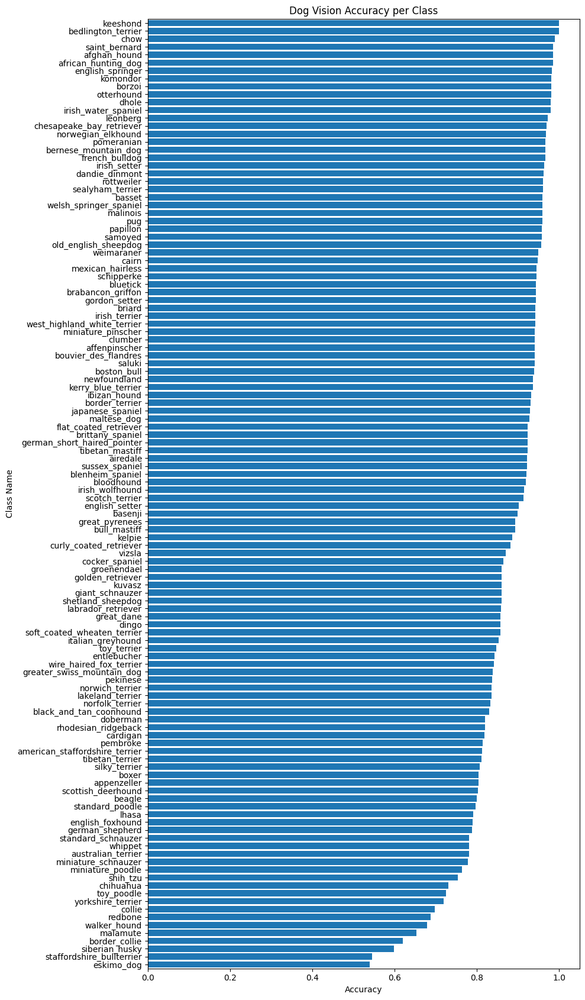

In [114]:
# Let's create a horizontal bar chart to replicate a similar plot to the original Stanford Dogs page
plt.figure(figsize=(10, 17))
plt.barh(y=accuracy_per_class_df["test_truth_class_name"],
         width=accuracy_per_class_df["correct"])
plt.xlabel("Accuracy")
plt.ylabel("Class Name")
plt.title("Dog Vision Accuracy per Class")
plt.ylim(-0.5, len(accuracy_per_class_df["test_truth_class_name"]) - 0.5)  # Adjust y-axis limits to reduce white space
plt.gca().invert_yaxis()  # This will display the first class at the top
plt.tight_layout()
plt.show()

In [115]:
# Inspecting our worst performing classes (note how only a couple of classes perform at ~55% accuracy or below)
accuracy_per_class_df.tail()

,test_truth_class_name,correct
71,malamute,0.653846
16,border_collie,0.620000
101,siberian_husky,0.597826
104,staffordshire_bullterrier,0.545455
43,eskimo_dog,0.540000


In [116]:
# Get most wrong
top_100_most_wrong = test_results_df[test_results_df["correct"] == 0].sort_values("test_pred_prob", ascending=False)[:100]
top_100_most_wrong.head()

,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
6884,54,0.996103,groenendael,95,schipperke,False
5480,44,0.994882,flat_coated_retriever,78,newfoundland,False
2727,75,0.990471,miniature_pinscher,38,doberman,False
6030,61,0.989102,japanese_spaniel,85,pekinese,False
1715,85,0.986671,pekinese,22,brabancon_griffon,False


In [117]:
# Get 10 random indexes of "most wrong" predictions
top_100_most_wrong.sample(n=10).index

Index([5959, 1715, 6037, 6383, 4247, 8452, 2001, 3995, 370, 7458], dtype='int64')

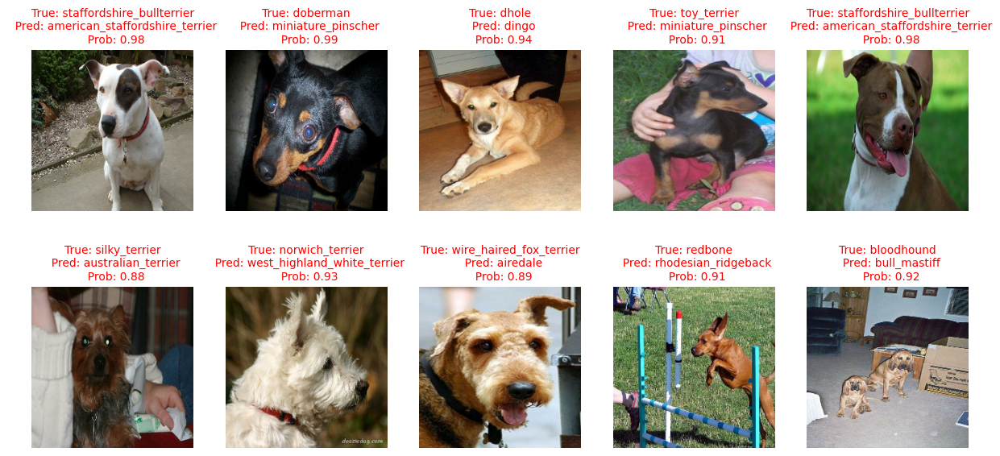

In [118]:
# Choose a random 10 indexes from the test data and compare the values
import random

random_most_wrong_indexes = top_100_most_wrong.sample(n=10).index

# Iterate through test results and plot them
# Note: This is why we don't shuffle the test data, so that it's in original order when we evaluate it.
fig, axes = plt.subplots(2, 5, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  target_index = random_most_wrong_indexes[i]

  # Get relevant target image, label, prediction and prediction probabilities
  test_image = test_ds_images[target_index]
  test_image_truth_label = class_names[tf.argmax(test_ds_labels[target_index])]
  test_image_pred_probs = test_preds[target_index]
  test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

  # Plot the image
  ax.imshow(test_image.astype("uint8"))

  # Create sample title
  title = f"""True: {test_image_truth_label}
  Pred: {test_image_pred_class}
  Prob: {np.max(test_image_pred_probs):.2f}"""

  # Colour the title based on correctness of pred
  ax.set_title(title,
               color="green" if test_image_truth_label == test_image_pred_class else "red",
               fontsize=10)
  ax.axis("off")

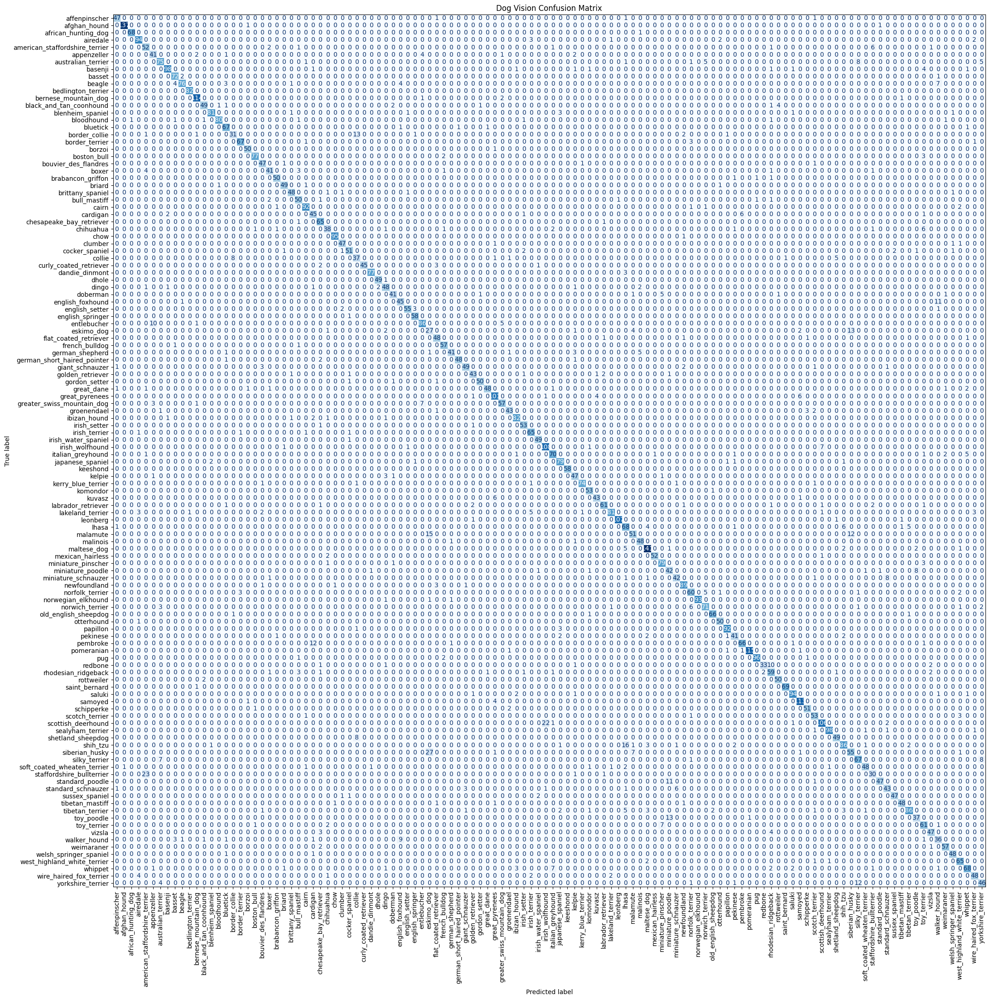

In [119]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Create a confusion matrix
confusion_matrix_dog_preds = confusion_matrix(y_true=test_ds_labels_argmax, # requires all labels to be in same format (e.g. not one-hot)
                                              y_pred=test_preds_labels)
# Create a confusion matrix plot
confusion_matrix_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_dog_preds,
                                                  display_labels=class_names)
fig, ax = plt.subplots(figsize=(25, 25))
ax.set_title("Dog Vision Confusion Matrix")
confusion_matrix_display.plot(xticks_rotation="vertical",
                              cmap="Blues",
                              colorbar=False,
                              ax=ax);

In [120]:
# Save the model to .keras
model_save_path = "dog_vision_model.keras"
model_1.save(filepath=model_save_path,
             save_format="keras")

In [121]:
# Load the model
loaded_model = tf.keras.models.load_model(filepath=model_save_path)

In [122]:
# Evaluate the loaded model
loaded_model_results = loaded_model.evaluate(test_ds)

269/269 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - accuracy: 0.9002 - loss: 0.3204


In [123]:
assert model_1_results == loaded_model_results

In [124]:
# Download a set of custom images from GitHub and unzip them
!wget -nc https://github.com/mrdbourke/zero-to-mastery-ml/raw/master/images/dog-photos.zip
!unzip dog-photos.zip

--2024-10-27 20:53:45--  https://github.com/mrdbourke/zero-to-mastery-ml/raw/master/images/dog-photos.zip
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/mrdbourke/zero-to-mastery-ml/master/images/dog-photos.zip [following]
--2024-10-27 20:53:45--  https://raw.githubusercontent.com/mrdbourke/zero-to-mastery-ml/master/images/dog-photos.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1091355 (1.0M) [application/zip]
Saving to: ‘dog-photos.zip’

dog-photos.zip      100%[===================>]   1.04M  --.-KB/s    in 0.06s   

2024-10-27 20:53:45 (18.1 MB/s) - ‘dog-photos.zip’ saved [1091355/1091

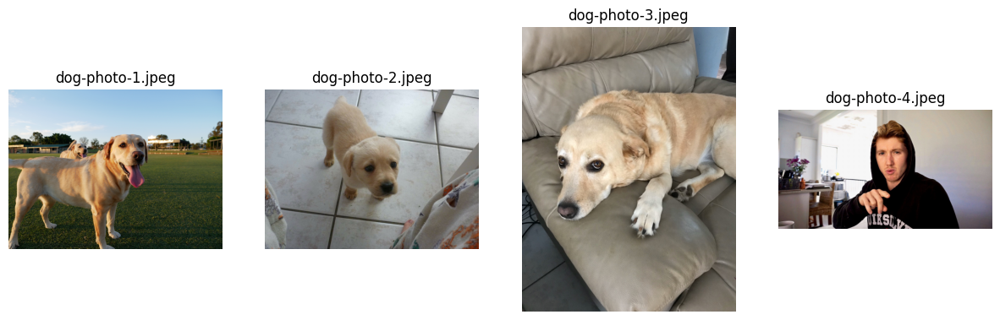

In [125]:
# Create list of paths for custom dog images
custom_image_paths = ["dog-photo-1.jpeg",
                      "dog-photo-2.jpeg",
                      "dog-photo-3.jpeg",
                      "dog-photo-4.jpeg"]

# Iterate through list of dog images and plot each one
fig, axes = plt.subplots(1, 4, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  ax.imshow(plt.imread(custom_image_paths[i]))
  ax.axis("off")
  ax.set_title(custom_image_paths[i])

In [126]:
# Load the image (into PIL format)
custom_image = tf.keras.utils.load_img(
  path="dog-photo-1.jpeg",
  color_mode="rgb",
  target_size=IMG_SIZE, # (224, 224) or (img_height, img_width)
)

type(custom_image), custom_image

(PIL.Image.Image, <PIL.Image.Image image mode=RGB size=224x224>)

In [127]:
# Turn the image into a tensor
custom_image_tensor = tf.keras.utils.img_to_array(custom_image)
custom_image_tensor.shape

(224, 224, 3)

In [128]:
# Get prediction probabilities from our mdoel
pred_probs = loaded_model.predict(tf.expand_dims(custom_image_tensor, axis=0))
pred_probs

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


array([[6.2534048e-07, 1.2345785e-05, 3.1651314e-06, 2.2436468e-05,
        4.0992573e-03, 2.2573852e-04, 4.5646007e-06, 1.6974153e-04,
        8.3044088e-06, 3.2897363e-04, 2.7354545e-06, 3.2283149e-06,
        8.7667006e-04, 3.4908874e-06, 2.3456900e-03, 1.6898950e-04,
        4.8488291e-05, 8.2225961e-05, 9.1614893e-05, 8.7760227e-06,
        4.4900889e-06, 1.5271094e-04, 9.0724483e-05, 4.6922392e-05,
        3.6966184e-04, 3.9582025e-02, 4.0965526e-05, 1.5269696e-04,
        1.2262170e-02, 6.8270345e-04, 5.5720715e-04, 3.9325030e-05,
        9.2354312e-05, 5.7813391e-04, 1.1633778e-04, 1.1550858e-05,
        5.6206727e-06, 5.7027433e-03, 5.7557008e-05, 4.1205680e-04,
        1.1942512e-04, 1.7121008e-06, 1.5393744e-04, 1.6877514e-03,
        4.0493882e-04, 6.8257260e-04, 9.7081525e-04, 1.3192456e-04,
        1.2662953e-05, 2.8026155e-01, 1.5721973e-06, 8.8574062e-04,
        4.6342839e-03, 3.0533699e-04, 2.0884158e-06, 3.6534278e-05,
        2.3979443e-05, 6.2076586e-05, 7.9366464e

In [129]:
# Get the predicted class label
pred_label = tf.argmax(pred_probs, axis=-1).numpy()[0]

# Get the predicted class name
pred_class_name = class_names[pred_label]

print(f"Predicted class label: {pred_label}")
print(f"Predicted class name: {pred_class_name}")

Predicted class label: 67
Predicted class name: labrador_retriever


In [130]:
def pred_on_custom_image(image_path: str,  # Path to the image file
                         model,  # Trained TensorFlow model for prediction
                         target_size: tuple[int, int] = (224, 224),  # Desired size of the image for input to the model
                         class_names: list = None,  # List of class names (optional for plotting)
                         plot: bool = True): # Whether to plot the image and predicted class
  """
  Loads an image, preprocesses it, makes a prediction using a provided model,
  and optionally plots the image with the predicted class.

  Args:
      image_path (str): Path to the image file.
      model: Trained TensorFlow model for prediction.
      target_size (int, optional): Desired size of the image for input to the model. Defaults to 224.
      class_names (list, optional): List of class names for plotting. Defaults to None.
      plot (bool, optional): Whether to plot the image and predicted class. Defaults to True.

  Returns:
     str: The predicted class.
  """

  # Prepare and load image
  custom_image = tf.keras.utils.load_img(
    path=image_path,
    color_mode="rgb",
    target_size=target_size,
  )

  # Turn the image into a tensor
  custom_image_tensor = tf.keras.utils.img_to_array(custom_image)

  # Add a batch dimension to the target tensor (e.g. (224, 224, 3) -> (1, 224, 224, 3))
  custom_image_tensor = tf.expand_dims(custom_image_tensor, axis=0)

  # Make a prediction with the target model
  pred_probs = model.predict(custom_image_tensor)

  # pred_probs = tf.keras.activations.softmax(tf.constant(pred_probs))
  pred_class = class_names[tf.argmax(pred_probs, axis=-1).numpy()[0]]

  # Plot if we want
  if not plot:
    return pred_class, pred_probs
  else:
    plt.figure(figsize=(5, 3))
    plt.imshow(plt.imread(image_path))
    plt.title(f"pred: {pred_class}\nprob: {tf.reduce_max(pred_probs):.3f}")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


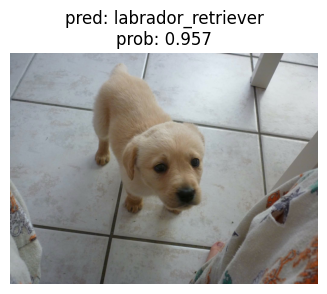

In [131]:
# Make prediction on custom dog photo 2
pred_on_custom_image(image_path="dog-photo-2.jpeg",
                     model=loaded_model,
                     class_names=class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


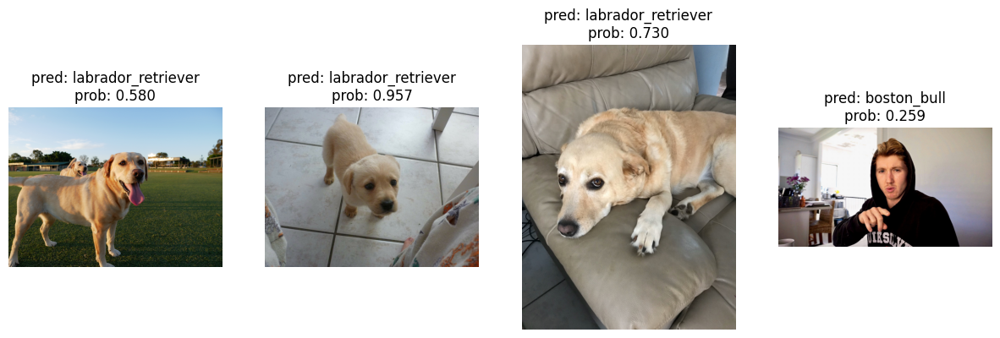

In [132]:
# Predict on multiple images
fig, axes = plt.subplots(1, 4, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  image_path = custom_image_paths[i]
  pred_class, pred_probs = pred_on_custom_image(image_path=image_path,
                                                model=loaded_model,
                                                class_names=class_names,
                                                plot=False)
  ax.imshow(plt.imread(image_path))
  ax.set_title(f"pred: {pred_class}\nprob: {tf.reduce_max(pred_probs):.3f}")
  ax.axis("off");